# September 12 - Final interpolations

In [41]:
# Imports
import math
import os
import sys
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D

# Add the path to the parent directory to augment search for module
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
if par_dir not in sys.path:
    sys.path.append(par_dir)
    
# Import the custom plotting module
from plot_utils import plot_utils
import random
import torch
from plot_utils import notebook_utils_2
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm, DivergingNorm

# Label dict
label_dict = {0:"gamma", 1:"e", 2:"mu"}

In [16]:
# 10x10 square represents one mPMT
# List of top-left pixel positions (row,col) for 2x2 grids representing PMTs 0 to 18
POS_MAP = [(8,4), #0
           (7,2), #1
           (6,0), #2
           (4,0), #3
           (2,0), #4
           (1,1), #5
           (0,4), #6
           (1,6), #7
           (2,8), #8
           (4,8), #9
           (6,8), #10
           (7,6), #11
           # Inner ring
           (6,4), #12
           (5,2), #13
           (3,2), #14
           (2,4), #15
           (3,6), #16
           (5,6), #17
           (4,4)] #18

PADDING = 0

def get_plot_array(event_data):
    
    # Assertions on the shape of the data and the number of input channels
    assert(len(event_data.shape) == 3 and event_data.shape[2] == 19)
    
    # Extract the number of rows and columns from the event data
    rows = event_data.shape[0]
    cols = event_data.shape[1]
    
    # Make empty output pixel grid
    output = np.zeros(((10+PADDING)*rows, (10+PADDING)*cols))
    
    i, j = 0, 0
    
    for row in range(rows):
        j = 0
        for col in range(cols):
            pmts = event_data[row, col]
            tile(output, (i, j), pmts)
            j += 10 + PADDING
        i += 10 + PADDING
        
    return output
            
def tile(canvas, ul, pmts):
    
    # First, create 10x10 grid representing single mpmt
    mpmt = np.zeros((10, 10))
    for i, val in enumerate(pmts):
        mpmt[POS_MAP[i][0]][POS_MAP[i][1]] = val

    # Then, place grid on appropriate position on canvas
    for row in range(10):
        for col in range(10):
            canvas[row+ul[0]][col+ul[1]] = mpmt[row][col]

In [30]:
# Plot the reconstructed vs actual events
def plot_interpolations(run_id, show_plot=False, save_path=None):
    
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
    model_status = "trained" 
    np_arr_path = dump_dir + model_status + "_interpolations.npz"

    # Load the np array into memory
    np_arr = np.load(np_arr_path)
    print("Loaded the npz array. Keys = ", list(np_arr.keys()))
    
    # Extract the actual interpolated events
    np_samples, np_pred_labels, np_pred_energies = np_arr["samples"], np_arr["predicted_labels"], np_arr["predicted_energies"]
    print("npz array shapes :", np_samples.shape, np_pred_labels.shape, np_pred_energies.shape)

    # Initialize the figure to plot the events
    fig, axes = plt.subplots(nrows=1,ncols=np_samples.shape[0],sharey=True, figsize=(31.4*np_samples.shape[0],21.6))
    
    # Extract the angles and energies of the nearest neighbor events
    np_energies_1, np_energies_2 = np_arr["energies_1"], np_arr["energies_2"]
    np_angles_1, np_angles_2 = np_arr["angles_1"], np_arr["angles_2"]
    
    print("npz array 2 shapes :", np_energies_1.shape, np_angles_1.shape)
    
    print("Energies 1 :", np.mean(np_energies_1), ", Energies 2 :", np.mean(np_energies_2))
    print("Angles 1 :", np.mean(np_angles_1), ", Angles 2 :", np.mean(np_angles_2))
    
    # Setup the plot
    dvgnorm = DivergingNorm(vcenter=0.1)
    
    # Flip the np_samples array to achieve a more accurate representation
    
    
    # Plot the inpterpolated events
    ims = []
    for i,ax in enumerate(axes):
        ims.append(ax.imshow(get_plot_array(np_samples[i]), origin="upper", cmap="afmhot", norm=dvgnorm, clim=(0.1, 10.0)))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    
    if save_path is not None:
        plt.savefig(save_path, format='eps', dpi=600)
    
    if show_plot:
        plt.show()
    else:
        plt.clf() # Clear the plot frame
        plt.close() # Close the opened window if any

In [31]:
plot_interpolations("20190913_172007", show_plot=True)

Loaded the npz array. Keys =  ['energies_1', 'energies_2', 'angles_1', 'angles_2', 'samples', 'predicted_labels', 'predicted_energies']
npz array shapes : (11, 16, 40, 19) (11,) (11, 1)
npz array 2 shapes : (256, 1) (256, 1)
Energies 1 : 800.80786 , Energies 2 : 799.27045
Angles 1 : -0.0017746633 , Angles 2 : -1.5652564


KeyboardInterrupt: 

In [ ]:
plot_interpolations("20190913_181739", show_plot=True)

Loaded the npz array. Keys =  ['energies_1', 'energies_2', 'angles_1', 'angles_2', 'samples', 'predicted_labels', 'predicted_energies']
npz array shapes : (11, 16, 40, 19) (11,) (11, 1)
npz array 2 shapes : (256, 1) (256, 1)
Energies 1 : 801.8385 , Energies 2 : 801.8385
Angles 1 : -0.024736663 , Angles 2 : -0.024736663


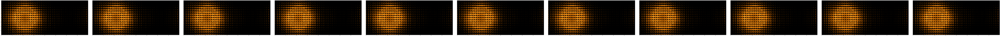

In [23]:
plot_interpolations("20190913_210442", show_plot=True)

Loaded the npz array. Keys =  ['energies_1', 'energies_2', 'angles_1', 'angles_2', 'samples', 'predicted_labels', 'predicted_energies']
npz array shapes : (11, 16, 40, 19) (11,) (11, 1)
npz array 2 shapes : (256, 1) (256, 1)
Energies 1 : 800.3391 , Energies 2 : 800.3391
Angles 1 : 1.6035169 , Angles 2 : 1.6035169


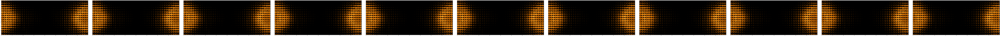

In [24]:
plot_interpolations("20190913_211013", show_plot=True)

Loaded the npz array. Keys =  ['energies_1', 'energies_2', 'angles_1', 'angles_2', 'samples', 'predicted_labels', 'predicted_energies']
npz array shapes : (11, 16, 40, 19) (11,) (11, 1)
npz array 2 shapes : (256, 1) (256, 1)
Energies 1 : 789.27893 , Energies 2 : 789.27893
Angles 1 : 2.550982 , Angles 2 : 2.550982


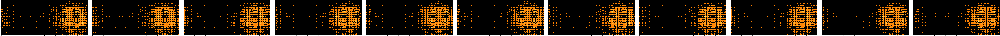

In [25]:
plot_interpolations("20190913_211423", show_plot=True)

Loaded the npz array. Keys =  ['energies_1', 'energies_2', 'angles_1', 'angles_2', 'samples', 'predicted_labels', 'predicted_energies']
npz array shapes : (11, 16, 40, 19) (11,) (11, 1)
npz array 2 shapes : (256, 1) (256, 1)
Energies 1 : 796.063 , Energies 2 : 796.063
Angles 1 : 2.8885512 , Angles 2 : 2.8885512


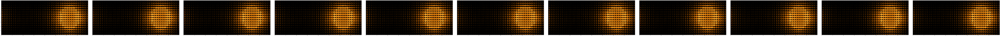

In [26]:
plot_interpolations("20190913_211625", show_plot=True)

Loaded the npz array. Keys =  ['energies_1', 'energies_2', 'angles_1', 'angles_2', 'samples', 'predicted_labels', 'predicted_energies']
npz array shapes : (11, 16, 40, 19) (11,) (11, 1)
npz array 2 shapes : (256, 1) (256, 1)
Energies 1 : 807.2582 , Energies 2 : 807.2582
Angles 1 : -2.8960323 , Angles 2 : -2.8960323


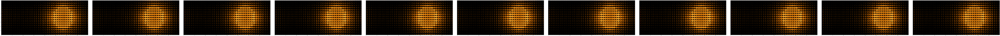

In [27]:
plot_interpolations("20190913_212254", show_plot=True)

In [78]:
# Plot the reconstructed vs actual events
def plot_actual_vs_recon(actual_event, recon_event, label, energy, predicted_label="gamma", predicted_energy=500, show_plot=False, save_path=None):
    """
    plot_actual_vs_recon(actual_event=None, recon_event=None, show_plot=False, save_path=None):
                           
    Purpose : Plot the actual event vs event reconstructed by the VAE
    
    Args: actual_event        ... 3-D NumPy array with the event data, shape=(width, height, depth)
          recon_event         ... 3-D NumPy array with the reconstruction data, shape = (width, height, depth)
          label               ... Str with the true event label, e.g. "e", "mu", "gamma"
          energy              ... Float value of the true energy of the event
          show_plot[optional] ... Boolean to determine whether to show the plot, default=False
          save_path[optional] ... Path to save the plot to, format='eps', default=None
    """
    
    # Assertions
    assert actual_event is not None
    assert recon_event is not None
    assert label is not None
    assert energy is not None and energy >= 0
    assert len(actual_event.shape) == 3
    assert len(recon_event.shape) == 3
    
    # Initialize the figure to plot the events
    fig, axes = plt.subplots(2,1,figsize=(32,18))
    plt.subplots_adjust(hspace=0.2)
    
    # Setup the plot
    ratio=0.8
    dvgnorm = DivergingNorm(vcenter=0.1)
    colors2 = plt.cm.afmhot(np.linspace(0., 1, math.floor(ratio*1024)))
    colors1 = plt.cm.bone(np.linspace(0, 0.5, math.ceil((1.0-ratio)*1024)))
    colors = np.vstack((colors1, colors2))
    mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)
    
    # Setup the plot
    if label is not "e":
        actual_event_title = r"Actual event display : $\{0}$ event with true energy, $E = {1:.3f}$".format(label, energy)
    else:
        actual_event_title = r"Actual event display : ${0}$ event with true energy, $E = {1:.3f}$".format(label, energy)
        
    fig.suptitle("Actual vs Reconstructed event display", fontsize=30)
    
    # Plot the actual event
    im_0 = axes[0].imshow(get_plot_array(actual_event), origin="upper", cmap=mymap, norm=dvgnorm, clim=(0, 10.0))
    
    axes[0].set_title(actual_event_title, fontsize=25)
    axes[0].set_xlabel("PMT module X-position", fontsize=20)
    axes[0].set_ylabel("PMT module Y-position", fontsize=20)
    axes[0].grid(True, which="both", axis="both")
    
    ax0_cbar = fig.colorbar(im_0, extend='both', ax=axes[0])
    ax0_cbar.set_label(r"Log charge, $log c$", fontsize=20)
    
    axes[0].tick_params(labelsize=20)
    ax0_cbar.ax.tick_params(labelsize=20) 
    
    axes[0].set_xticklabels((axes[0].get_xticks()/10).astype(int))
    axes[0].set_yticklabels((axes[0].get_yticks()/10).astype(int))
    
    # Plot the reconstructed event
    im_1 = axes[1].imshow(get_plot_array(recon_event), origin="upper", cmap=mymap, norm=dvgnorm, clim=(0, 10.0))
    
    if predicted_label is not "e":
        recon_event_title = r"Reconstructed event display : $\{0}$ event with true energy, $E = {1:.3f}$".format(predicted_label, predicted_energy)
    else:
        recon_event_title = r"Reconstructed event display : ${0}$ event with true energy, $E = {1:.3f}$".format(predicted_label, predicted_energy)
        
    axes[1].set_title(recon_event_title, fontsize=25)
    axes[1].set_xlabel("PMT module X-position", fontsize=20)
    axes[1].set_ylabel("PMT module Y-position", fontsize=20)
    axes[1].grid(True, which="both", axis="both")
    
    ax1_cbar = fig.colorbar(im_1, extend='both', ax=axes[1])
    ax1_cbar.set_label(r"Log charge, $log c$", fontsize=20)
    
    axes[1].tick_params(labelsize=20)
    ax1_cbar.ax.tick_params(labelsize=20)
    
    axes[1].set_xticklabels((axes[1].get_xticks()/10).astype(int))
    axes[1].set_yticklabels((axes[1].get_yticks()/10).astype(int))
    
    if save_path is not None:
        plt.savefig(save_path, format='eps', dpi=300)
    
    if show_plot:
        plt.show()
    else:
        plt.clf() # Clear the plot frame
        plt.close() # Close the opened window if any

npz array keys :  ['energies_1', 'energies_2', 'angles_1', 'angles_2', 'samples', 'predicted_labels', 'predicted_energies']
npz array shapes : (11, 16, 40, 19) (11,) (11, 1)


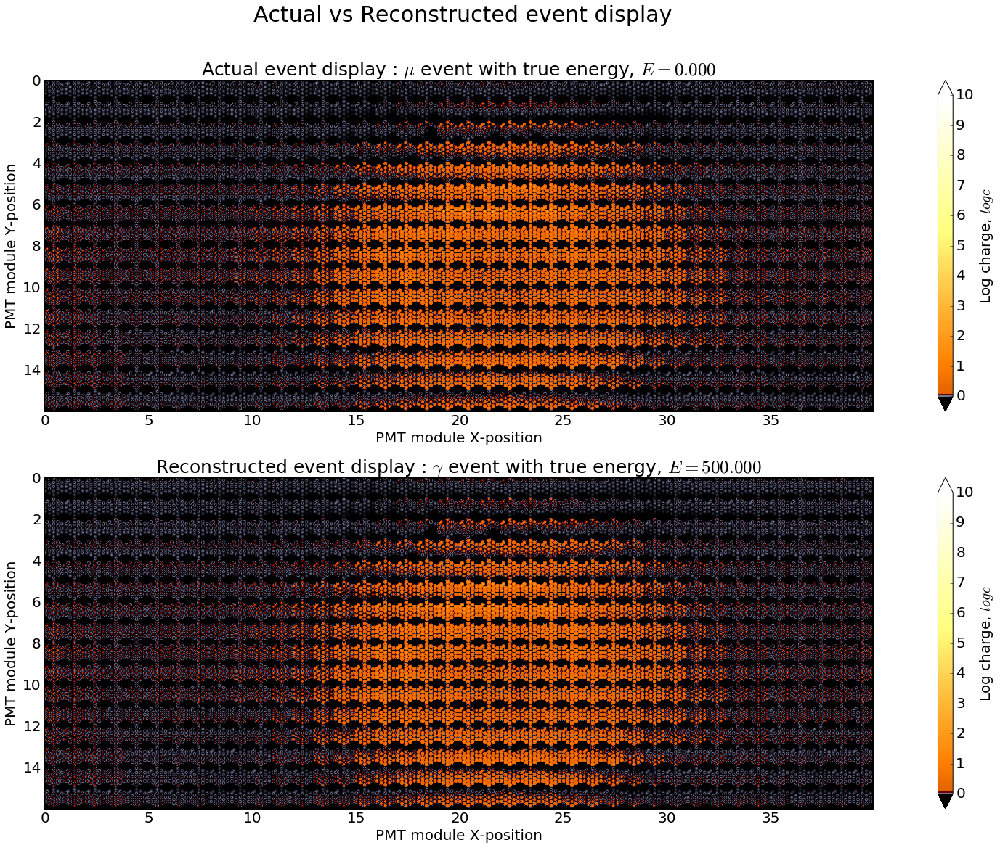

658.4209 589.0348
-0.004920316 -1.1502229


In [69]:
run_id = "20190913_045839"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
model_status = "trained" 
np_arr_path = dump_dir + model_status + "_interpolations.npz"

# Load the np array into memory
np_arr = np.load(np_arr_path)
print("npz array keys : ", list(np_arr.keys()))

# Extract the actual interpolated events
np_samples, np_pred_labels, np_pred_energies = np_arr["samples"], np_arr["predicted_labels"], np_arr["predicted_energies"]
print("npz array shapes :", np_samples.shape, np_pred_labels.shape, np_pred_energies.shape)

i = np_samples.shape[0]-1
while i > 8:
    plot_actual_vs_recon(np_samples[i], np_samples[i-1], label_dict[np_pred_labels[i]],
                         np_pred_energies[i].item(), show_plot=True)
    i = i - 2

np_energies_1, np_energies_2 = np_arr["energies_1"], np_arr["energies_2"]
np_angles_1, np_angles_2 = np_arr["angles_1"], np_arr["angles_2"]

print(np.mean(np_energies_1), np.mean(np_energies_2))
print(np.mean(np_angles_1), np.mean(np_angles_2))

In [74]:
run_id = "20190910_224503"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/iteration_561000.npz"

# Load the np array into memory
np_arr = np.load(dump_dir)
print("npz array keys : ", list(np_arr.keys()))

npz array keys :  ['events', 'labels', 'energies', 'recon', 'z', 'mu', 'logvar', 'z_prime']


In [76]:
np_events = np_arr["events"]
np_recon = np_arr["recon"]
np_labels = np_arr["labels"]
np_energies = np_arr["energies"]

print(np_events.shape, np_recon.shape, np_labels.shape, np_energies.shape)

(1024, 16, 40, 19) (1024, 16, 40, 19) (1024,) (1024, 1)


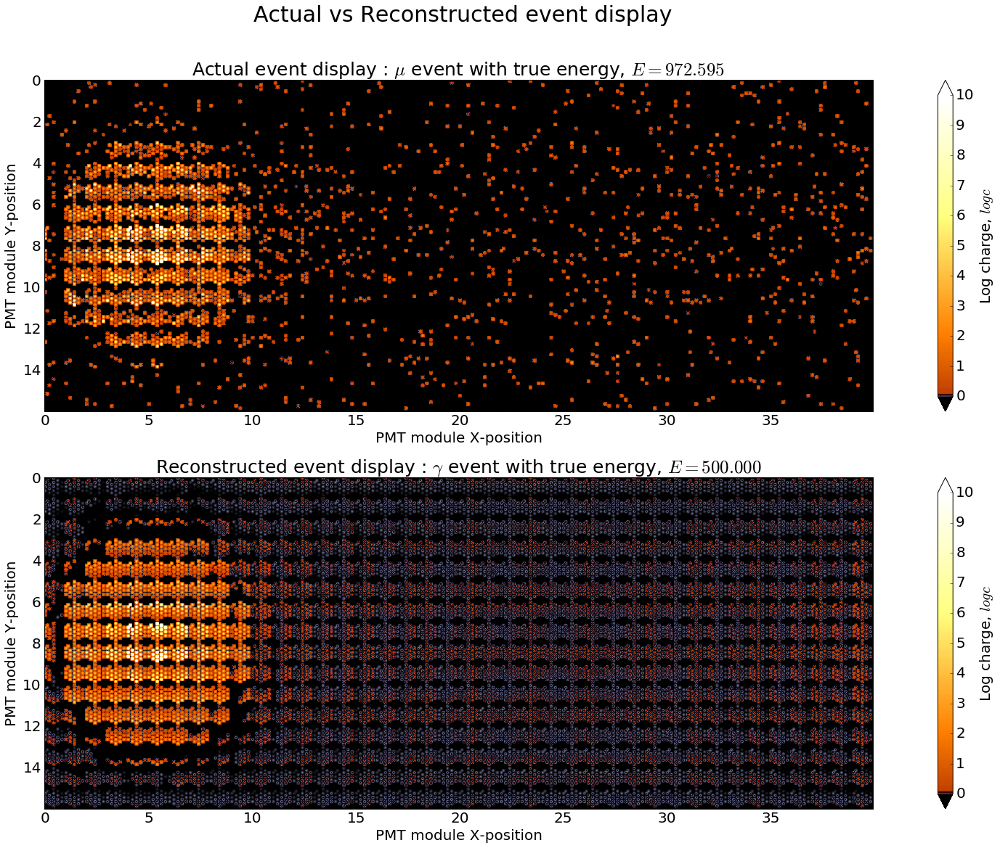

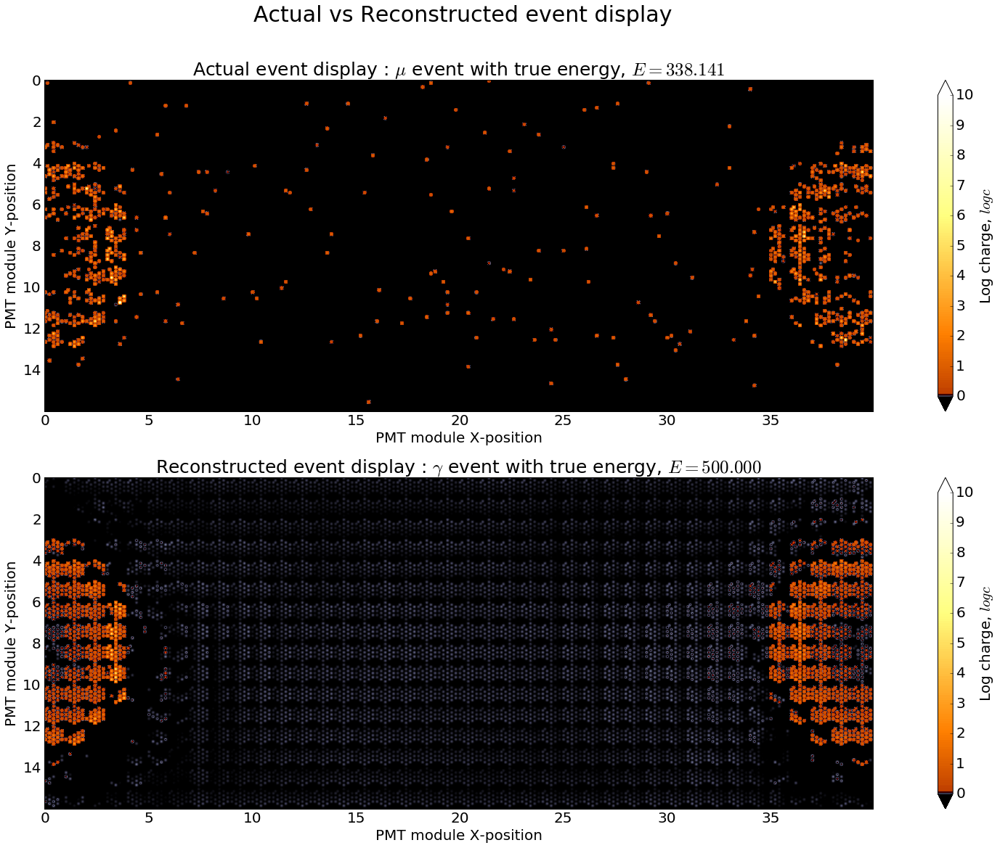

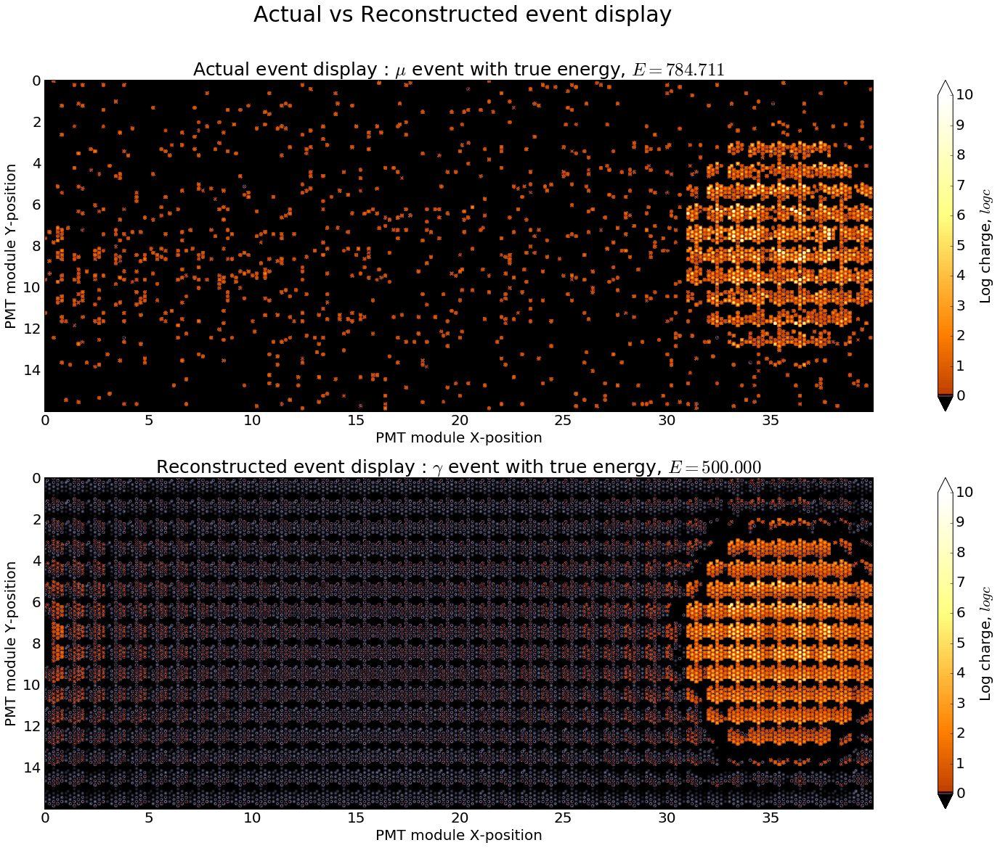

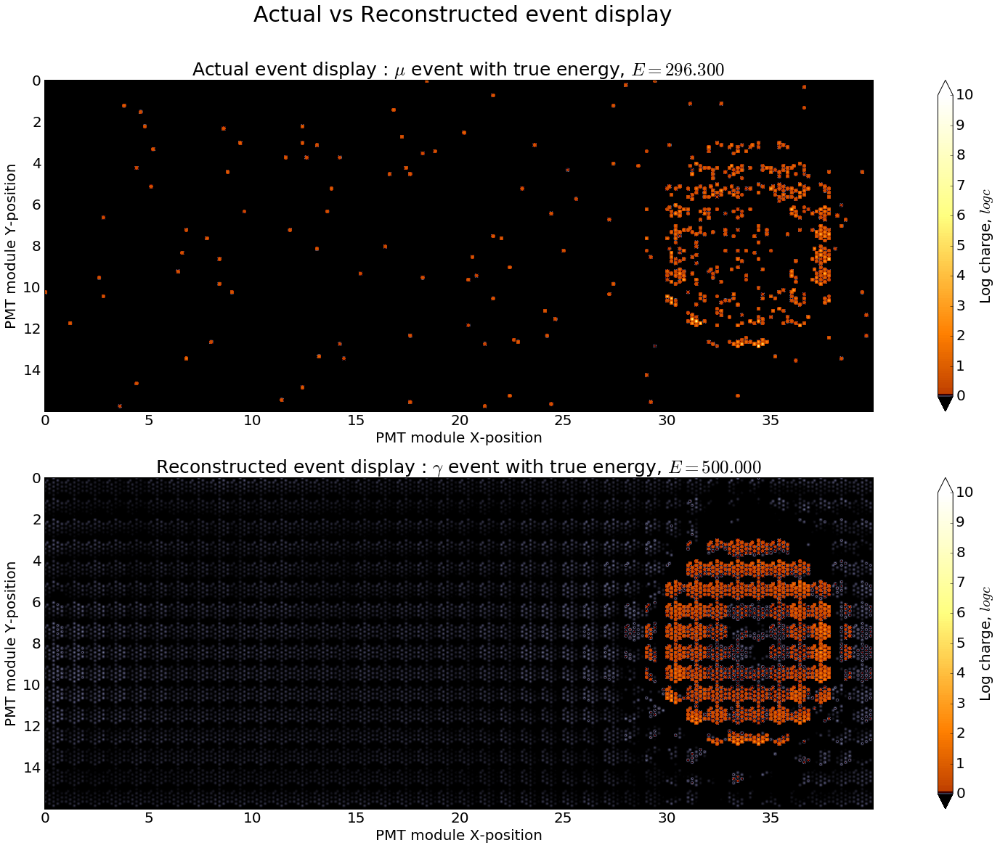

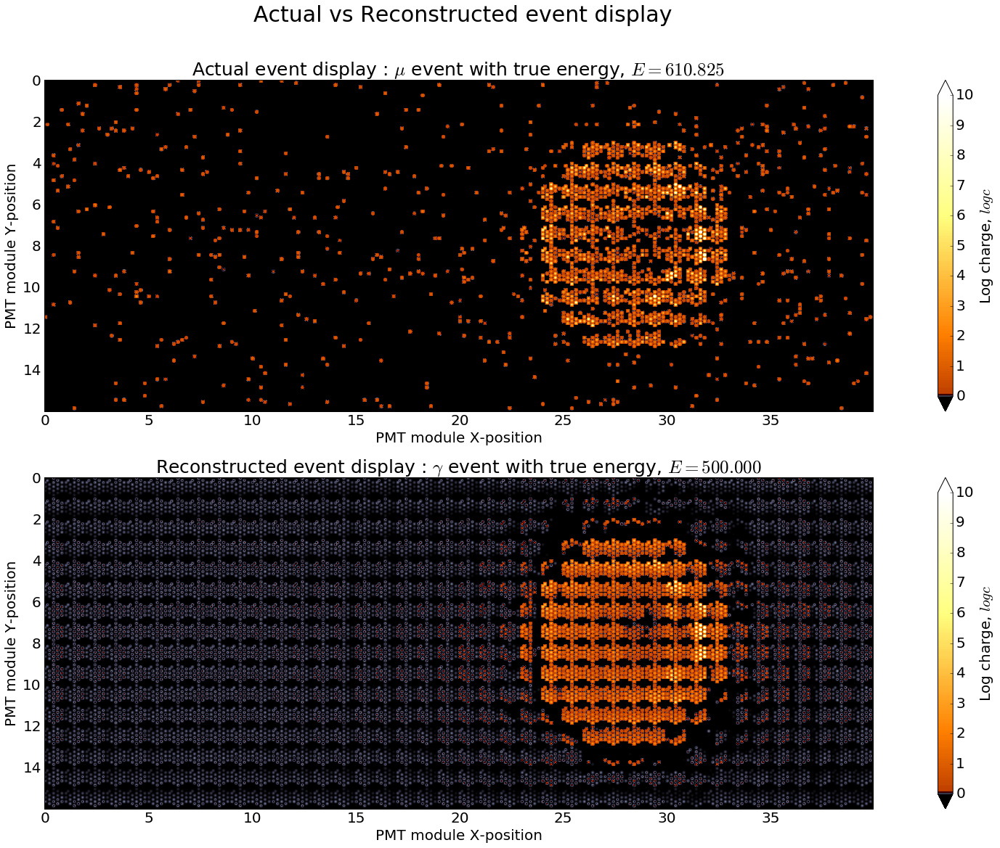

In [79]:
for i in range(5):
    plot_actual_vs_recon(np_events[i], np_recon[i], label_dict[np_labels[i]],
                         np_energies[i].item(), show_plot=True)